In [57]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import hypll
from hypll.manifolds.poincare_ball import Curvature, PoincareBall
from hypll.optim import RiemannianAdam
import hypll.nn as hnn
from hypll.tensors import TangentTensor
from matplotlib.animation import FuncAnimation
import argparse
from pyramid import create_pyramid
from continuous_maze import bfs, gen_traj, plot_traj, ContinuousGridEnvironment, TrajectoryDataset, LabelDataset
from hyperbolic_networks import HyperbolicMLP, hyperbolic_infoNCE_loss, manifold_map
from networks import StateActionEncoder, StateEncoder, infoNCE_loss
from train import get_maze
import os

FileNotFoundError: [Errno 2] No such file or directory: 'models/experiment1_hyperbolic_False_epochs_1024_trajectories_100000_maze_nested_pyramid_embeddingdim_8_gamma_0.01_batch_128_encoder1_epoch_769.pth'

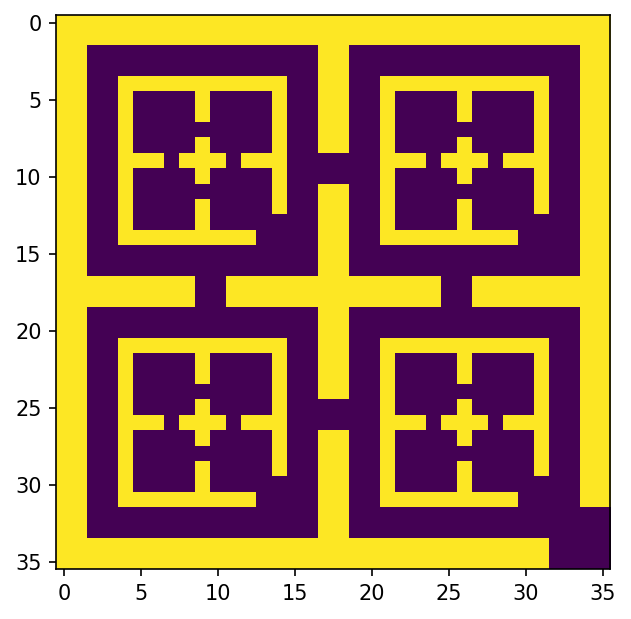

In [58]:
hyperbolic = False
maze_type = 'nested_pyramid'
maze = get_maze(maze_type)

# e1_path = f'/home/yongweic/hyperbolic/models/experiment_hyperbolic_{hyperbolic}_epochs_8_trajectories_10000_maze_{maze_type}_embeddingdim_2_encoder1_epoch_8.pth'
# e2_path = f'/home/yongweic/hyperbolic/models/experiment_hyperbolic_{hyperbolic}_epochs_8_trajectories_10000_maze_{maze_type}_embeddingdim_2_encoder2_epoch_8.pth'

e1_path = f'models/experiment1_hyperbolic_False_epochs_1024_trajectories_100000_maze_nested_pyramid_embeddingdim_8_gamma_0.01_batch_128_encoder1_epoch_769.pth'
e2_path = f'models/experiment1_hyperbolic_False_epochs_1024_trajectories_100000_maze_nested_pyramid_embeddingdim_8_gamma_0.01_batch_128_encoder2_epoch_769.pth'


device = "cuda" if torch.cuda.is_available() else "cpu"

manifold = PoincareBall(c=Curvature(value=0.1, requires_grad=True))

if hyperbolic:
    encoder1 = HyperbolicMLP(in_features=4, out_features=2, manifold=manifold.to(device)).to(device)
    encoder2 = HyperbolicMLP(in_features=2, out_features=2, manifold=manifold.to(device)).to(device)
    optimizer = RiemannianAdam(list(encoder1.parameters()) + list(encoder2.parameters()), lr=0.001)
else:
    encoder1 = StateActionEncoder(8).to(device)
    encoder2 = StateEncoder(8).to(device)
    optimizer = optim.Adam(list(encoder1.parameters()) + list(encoder2.parameters()), lr=0.001)

encoder1.load_state_dict(torch.load(e1_path))
encoder2.load_state_dict(torch.load(e2_path))

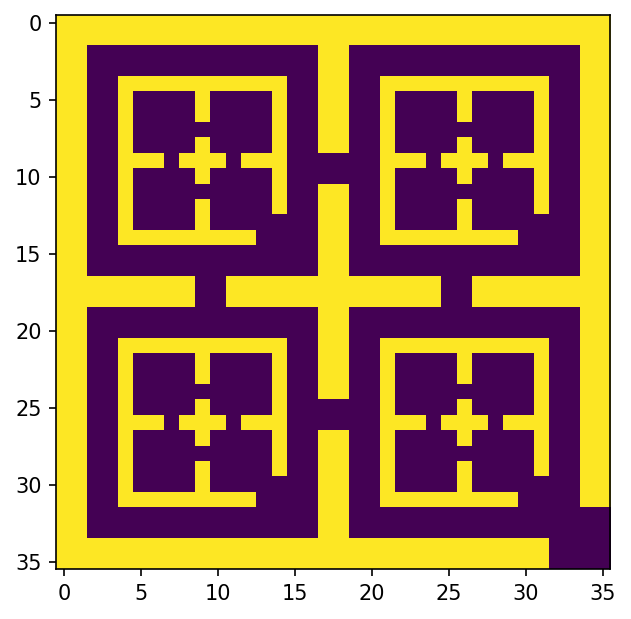

In [8]:
plt.imshow(maze)

In [9]:
valid_indices = np.argwhere(maze == 0)
valid_indices = valid_indices + 0.5

valid_indices

array([[ 2.5,  2.5],
       [ 2.5,  3.5],
       [ 2.5,  4.5],
       ...,
       [35.5, 33.5],
       [35.5, 34.5],
       [35.5, 35.5]])

In [56]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as patches
from sklearn.manifold import TSNE

def plot(ax, maze, direction, encoder1, encoder2, manifold, hyperbolic, device):
    with torch.no_grad():
        points = []
        valid_indices = np.argwhere(maze == 0)
        valid_indices = valid_indices + 0.5
        grid = valid_indices
        
        for p in grid:
            v = torch.tensor(p).to(device, torch.float32)
            v = encoder2(v)
            if hyperbolic:
                v = manifold.project(v)
                v = v.tensor
            points.append(v.cpu().detach().numpy())
        dir_points = []
        for p in grid:
            v = torch.stack([torch.tensor(p), direction]).flatten().to(device, torch.float32)
            v = encoder1(v)
            if hyperbolic:
                v = manifold.project(v)
                v = v.tensor
            dir_points.append(v.cpu().detach().numpy())
    
    points = np.array(points)
    dir_points = np.array(dir_points)
    
    # Perform t-SNE on points and dir_points
    tsne = TSNE(n_components=2, random_state=42)
    points_tsne = tsne.fit_transform(points)
    dir_points_tsne = tsne.fit_transform(dir_points)
    
    # Compute distances from origin
    distances_points = torch.norm(torch.tensor(grid) - torch.tensor([5., 5.]), dim=1).numpy()
    distances_dir_points = torch.norm(torch.tensor(grid) - torch.tensor([5., 5.]), dim=1).numpy()
    
    # Normalize distances for colormap
    norm_distances_points = (distances_points - distances_points.min()) / (distances_points.max() - distances_points.min())
    norm_distances_dir_points = (distances_dir_points - distances_dir_points.min()) / (distances_dir_points.max() - distances_dir_points.min())
    
    # Use a colormap
    cmap = cm.viridis
    
    # Create scatter plots with colors based on distance
    scatter1 = ax.scatter(x=points_tsne[:,0], y=points_tsne[:,1], c=norm_distances_points, cmap=cmap, label='Points')
    scatter2 = ax.scatter(x=dir_points_tsne[:,0], y=dir_points_tsne[:,1], c=norm_distances_dir_points, cmap=cmap, marker='x', label='Direction Points')
    
    # Add color bar for the first scatter plot
    if ax.get_legend() is None:
        plt.colorbar(scatter1, ax=ax, label='Distance from Origin')
    
    if hyperbolic:
        ax.set_title(f't-SNE Hyperbolic, direction={direction}')
    else:
        ax.set_title(f't-SNE Euclidean, direction={direction}')
    ax.legend()

# Create a figure and a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# Example usage
directions = [torch.tensor([1., 0.]), torch.tensor([-1., 0.]), torch.tensor([0., 1.]), torch.tensor([0., -1.])]
ax_flat = axs.flatten()  # Flatten the 2x2 array of axes for easy iteration

for i, direction in enumerate(directions):
    plot(ax_flat[i], maze, direction, encoder1, encoder2, manifold, hyperbolic, device)

plt.tight_layout()
plt.show()

ModuleNotFoundError: No module named 'sklearn'

In [12]:
hyperbolic

False

In [10]:
def visualize_path(start, end, encoder_mod1, encoder_mod2, hyperbolic=False, manifold=None, max_steps=100, eps=50):
    with torch.no_grad():
        # maze.cpu()
        vec2 = None
        start = torch.tensor(start).to(device, torch.float32)
        goal = torch.tensor(end).to(device, torch.float32)
        
        vec2 = encoder_mod2(goal)

        env = ContinuousGridEnvironment(maze, start.cpu(), {})
        fig, ax = plt.subplots()

        def update(i):
            with torch.no_grad():
                cur_pos = env.agent_position

                activations = []
                angles = torch.linspace(0., 2 * torch.pi, 16)
                for a in angles:
                    action = torch.tensor([torch.sin(a), torch.cos(a)])
                    vec1 = torch.tensor([cur_pos[0], cur_pos[1], torch.sin(a), torch.cos(a)]).to(device, torch.float32)
                    vec1 = encoder_mod1(vec1)

                    # MANIFOLD EVAL
                    if hyperbolic:
                        activations.append((action, -manifold.dist(x=vec1, y=vec2)))
                    else:
                        activations.append((action, -torch.norm(vec1 - vec2)))

                best_action = activations[np.argmax([x[1].cpu() for x in activations])][0]
                angle = np.arctan2(best_action[0], best_action[1]) + np.random.normal() * eps * (2 * np.pi / 360)
                best_action = torch.tensor(np.array([np.sin(angle), np.cos(angle)]))
                env.move_agent(best_action)
                # print(f'agent position: {env.agent_position}')
                ax.clear()
                env.display(ax=ax)

        # Set animation display in Jupyter notebook and figure resolution
        plt.rcParams["animation.html"] = "jshtml"
        plt.rcParams['figure.dpi'] = 150

        # Create the animation
        ani = FuncAnimation(fig, update, frames=max_steps, interval=max_steps, repeat=False)

    return ani

In [ ]:
start = torch.tensor([0., 0.])
end = torch.tensor([10., 10.])


visualize_path(start, end, encoder1, encoder2, hyperbolic=hyperbolic, manifold=manifold)

/tmp/ipykernel_2183243/3839252379.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  start = torch.tensor(start).to(device, torch.float32)
/tmp/ipykernel_2183243/3839252379.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  goal = torch.tensor(end).to(device, torch.float32)


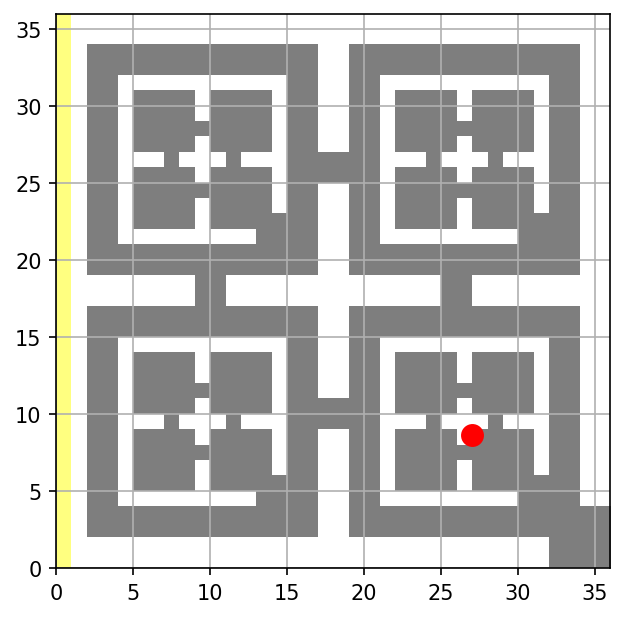

In [50]:
start = torch.tensor([7.5, 7.5])
end = torch.tensor([23.5, 23.5])


visualize_path(start, end, encoder1, encoder2, hyperbolic=hyperbolic, manifold=manifold, max_steps=500)

In [46]:
from train import evaluate

results = evaluate(maze, 100, encoder1, encoder2, manifold, max_steps=500, eps=50.)

In [51]:
np.mean([x[0] for x in results])

0.32

In [54]:
dataset = TrajectoryDataset(maze, 1000, embedding_dim=8, num_negatives=10, gamma=0.01)

gamma: 0.01


(array([ 58.,  75., 127., 131., 171., 186., 135.,  83.,  25.,   9.]),
 array([  1. ,  14.9,  28.8,  42.7,  56.6,  70.5,  84.4,  98.3, 112.2,
        126.1, 140. ]),
 <BarContainer object of 10 artists>)

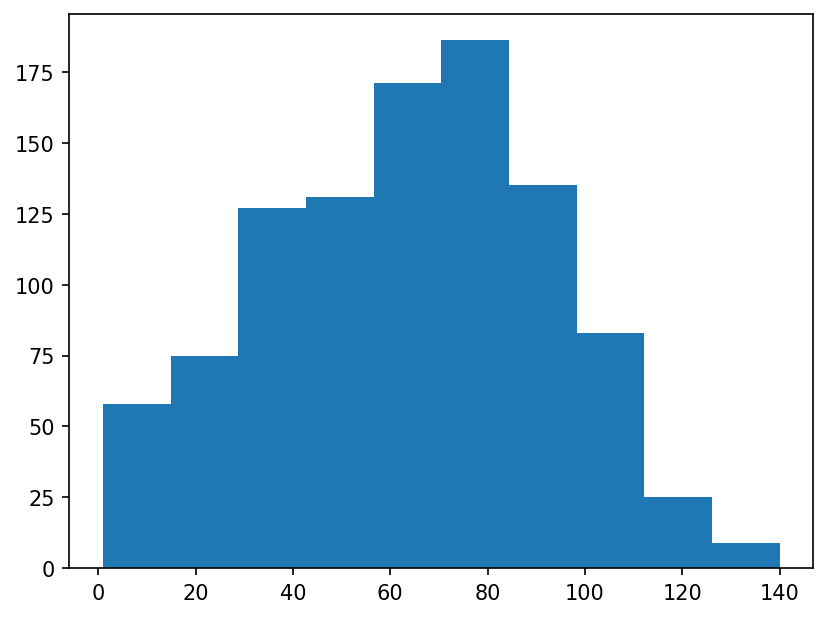

In [55]:
trajectories = dataset.trajectories

lengths = []
for traj in trajectories:
    lengths.append(len(traj))

plt.hist(lengths)

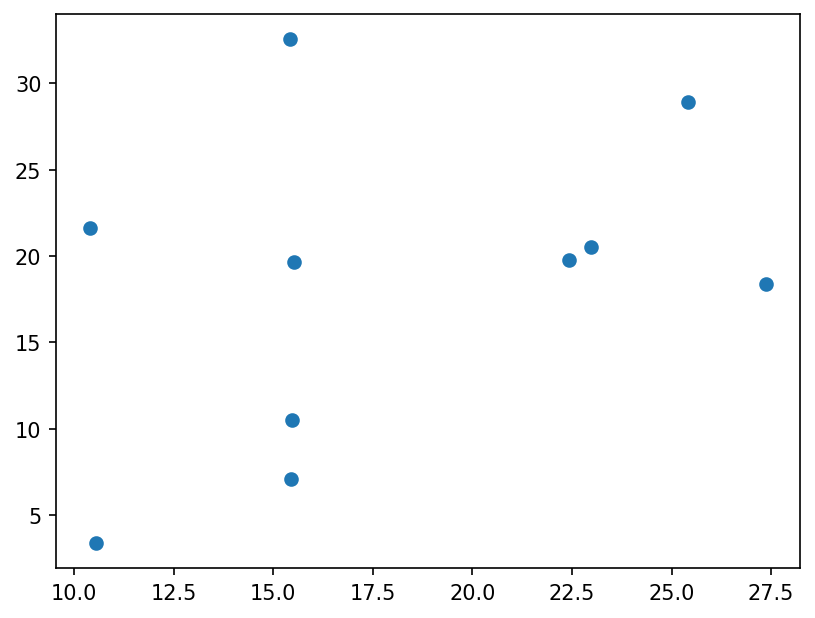

In [33]:
plt.scatter(dataset[1][2][:,0], dataset[1][2][:,1])